# Chlorophyll Map Files

In [1]:
#directory paths
_work_dir='/g/data/gv90/as2285/miz/'
_data_dir='/g/data/gv90/P6_data/'

In [2]:
#some constants
CLIMAT_DATES=[1998,2020]
EAST_ANT_LONS=[71,160] #longitudes for east Antartica (easterly)
YEAR=2021
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']


In [3]:
#useful py libraries
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import odc.geo
import odc.geo.geobox
import odc.geo.xr
from datacube.utils.cog import write_cog

In [4]:
# import local functions
import sys
sys.path.append(_work_dir)
from utils.climat import climatology



In [5]:
%run {_work_dir}utils/plot_tools.ipynb

# The Dataset

In [8]:
# place holder for how to do this in python
from os import listdir
file_names = listdir(f'{_data_dir}OCCCIv6.0/')
files = [f'{_data_dir}OCCCIv6.0/{iFile}' for iFile in file_names]

In [14]:
big_chlor_da=xr.open_mfdataset(files).chlor_a

In [15]:
big_chlor_da

<xarray.DataArray 'chlor_a' (time: 298, lat: 4320, lon: 8640)>
dask.array<concatenate, shape=(298, 4320, 8640), dtype=float32, chunksize=(1, 4320, 8640), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 89.98 89.94 89.9 89.85 ... -89.85 -89.9 -89.94 -89.98
  * lon      (lon) float64 -180.0 -179.9 -179.9 -179.9 ... 179.9 179.9 180.0
  * time     (time) datetime64[ns] 1997-09-04 1997-10-01 ... 2022-06-01
Attributes:
    ancillary_variables:  chlor_a_log10_rmsd chlor_a_log10_bias
    long_name:            Chlorophyll-a concentration in seawater (not log-tr...
    parameter_vocab_uri:  http://vocab.ndg.nerc.ac.uk/term/P011/current/CHLTVOLU
    standard_name:        mass_concentration_of_chlorophyll_a_in_sea_water
    units:                milligram m-3
    units_nonstandard:    mg m^-3

In [16]:
climat_chlor_ds=climatology(big_chlor_da, CLIMAT_DATES)

In [17]:
anoms_da=big_chlor_da.groupby('time.month')-climat_chlor_ds.ave

/g/data/gv90/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.10/site-packages/xarray/core/indexing.py:1374: PerformanceWarning: Slicing with an out-of-order index is generating 25 times more chunks
  return self.array[key]


# Set bounds

In [18]:
src_geobox=odc.geo.geobox.GeoBox.from_bbox(
    [-180,-90,180,90],
    "epsg:4326",
    shape=[4320,8640]
    )

In [19]:
map_geobox = odc.geo.geobox.GeoBox.from_bbox(
    [-4500000,-4500000,4500000,4500000],
    "epsg:3976",
    resolution=10000
    )

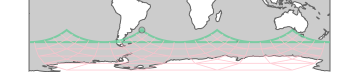

In [20]:
map_geobox

In [21]:
map_geobox.extent.exterior.to_crs("epsg:4326").points[:3]

[(-45.0, -35.58352463367147),
 (-135.0, -35.58352463367147),
 (135.0, -35.58352463367147)]

In [22]:
newNd = np.ndarray([900,900])

# cogs for tracker

In [23]:
START_YEAR='1980'

In [24]:
datetimes_xr=big_chlor_da.sel(time=slice(START_YEAR,'2050')).time

In [ ]:
for iTime in datetimes_xr:
    odc.geo.xr.rio_reproject(
        big_chlor_da.sel(time=iTime, drop=True).values,
        newNd,
        src_geobox,
        map_geobox,
        'bilinear',
        src_nodata=np.nan
    )

    new_xr=odc.geo.xr.wrap_xr(
        newNd,
        map_geobox
    )

    write_cog(
        new_xr,
        f'{_data_dir}tracker_data/chlor_conc_cog/chlor_conc_{iTime.dt.year.values}_{iTime.dt.month.values}.tiff',
        overwrite=True
    )

In [ ]:
for iTime in datetimes_xr:
    odc.geo.xr.rio_reproject(
        anoms_da.sel(time=iTime, drop=True).values,
        newNd,
        src_geobox,
        map_geobox,
        'bilinear',
        src_nodata=np.nan
    )

    new_xr=odc.geo.xr.wrap_xr(
        newNd,
        map_geobox
    )

    write_cog(
        new_xr,
        f'{_data_dir}tracker_data/chlor_conc_anoms_cog/chlor_anoms_{iTime.dt.year.values}_{iTime.dt.month.values}.tiff',
        overwrite=True
    )

# Some examples of different plot types

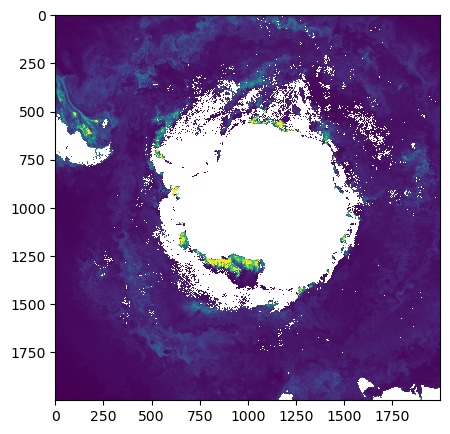

In [35]:
plt.figure(figsize=(5,5))

plt.imshow(newNd, vmin=0, vmax=5, interpolation='nearest')

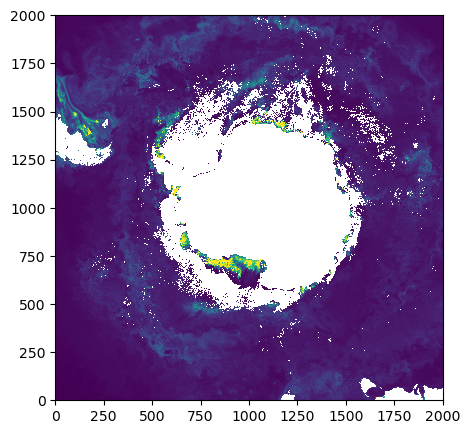

In [32]:
plt.figure(figsize=(5,5))

plt.pcolormesh(newNd[::-1], vmin=0, vmax=5)

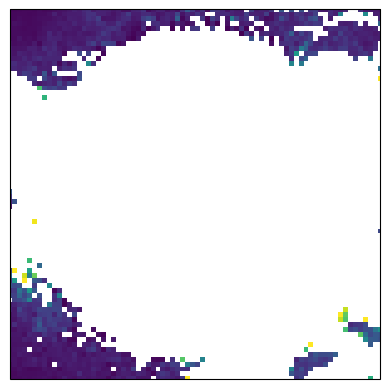

In [28]:
ax=plt.subplot(projection=ccrs.SouthPolarStereo())

plt.imshow(
    big_chlor_da.isel(time=291, drop=True).values, 
    vmin=0, vmax=5,
    transform=ccrs.PlateCarree(),
    #shading='gouraud'
)
    
    
ax.set_extent([-5000000.0, 5000000.0,-5000000.0, 5000000.0], ccrs.SouthPolarStereo())

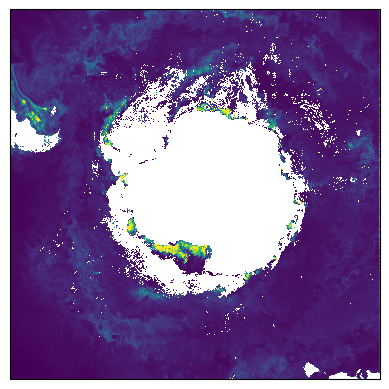

In [27]:
ax=plt.subplot(projection=ccrs.SouthPolarStereo())

to_plot=big_chlor_da.isel(time=291, drop=True)

plt.pcolormesh(
    to_plot.lon, to_plot.lat, to_plot, 
    vmin=0, vmax=5,
    transform=ccrs.PlateCarree(),
    shading='nearest'
)
    
    
ax.set_extent([-5000000.0, 5000000.0,-5000000.0, 5000000.0], ccrs.SouthPolarStereo())

In [111]:
import cartopy

In [127]:
cartopy_result=cartopy.img_transform.warp_array(
    big_chlor_da.isel(time=291, drop=True).values ,
    ccrs.SouthPolarStereo(true_scale_latitude=-71),
    source_proj=ccrs.PlateCarree(),
    source_extent=[-180,180,-90,90],
    target_res=(4000,4000),
    target_extent=(-5000000.0, 5000000.0, -5000000.0, 5000000.0)
)

In [128]:
cartopy_result[0]

array([[0.09213542, 0.10324302, 0.10324302, ..., 0.32984424, 0.32984424,
        0.32787666],
       [0.09414516, 0.09414516, 0.10324302, ..., 0.32984424, 0.24951458,
        0.24951458],
       [0.09414516, 0.09414516, 0.10088696, ..., 0.23968977, 0.24951458,
        0.24951458],
       ...,
       [0.10429045, 0.10429045, 0.10373295, ...,        nan,        nan,
               nan],
       [0.10429045, 0.1043019 , 0.1043019 , ...,        nan,        nan,
               nan],
       [0.10310012, 0.1043019 , 0.1043019 , ...,        nan,        nan,
               nan]], dtype=float32)

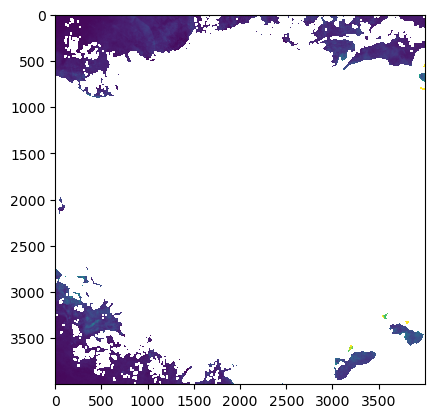

In [129]:
plt.imshow(cartopy_result[0], vmin=0, vmax=5)

# Climatology

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


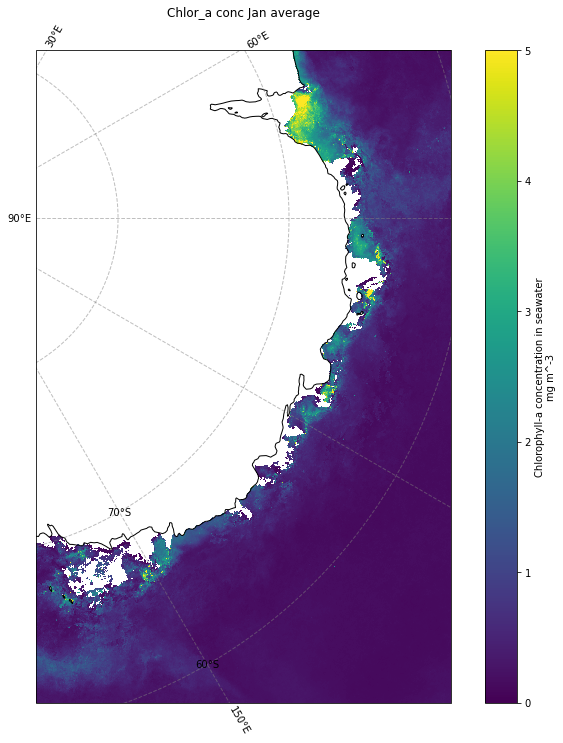

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


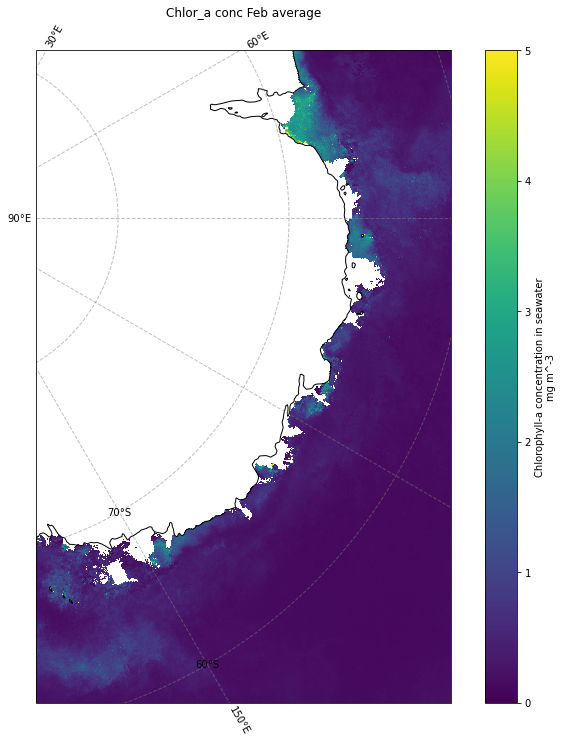

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


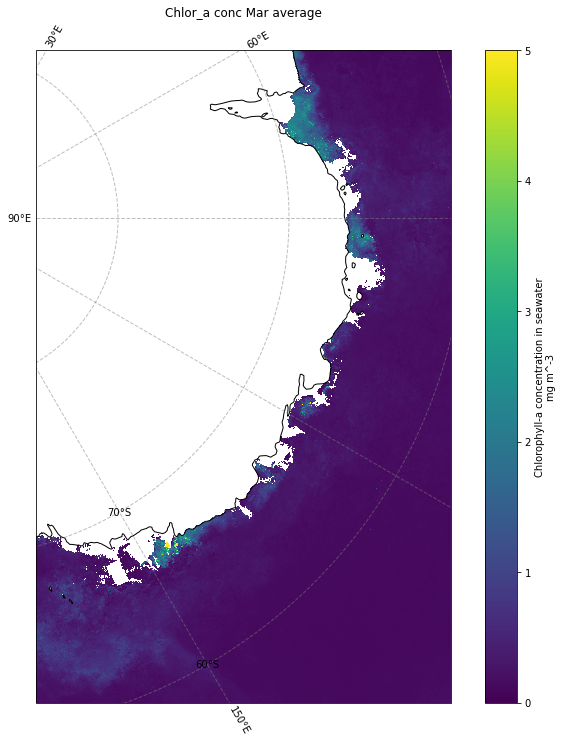

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


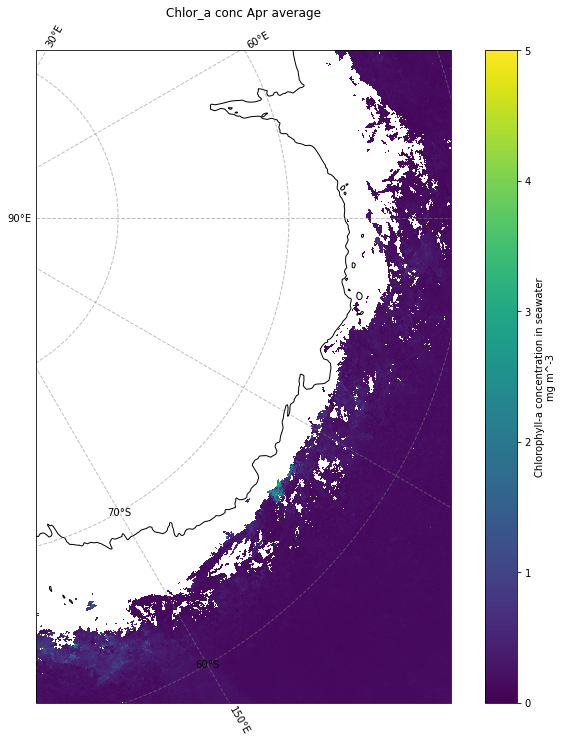

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


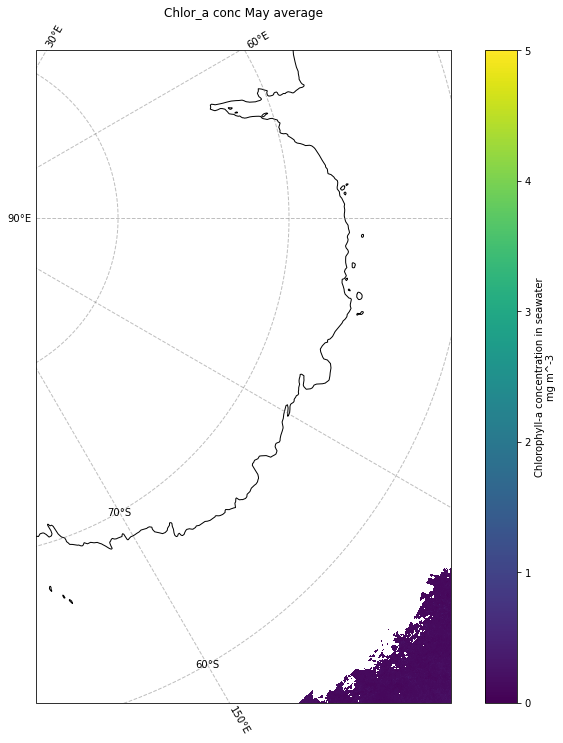

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


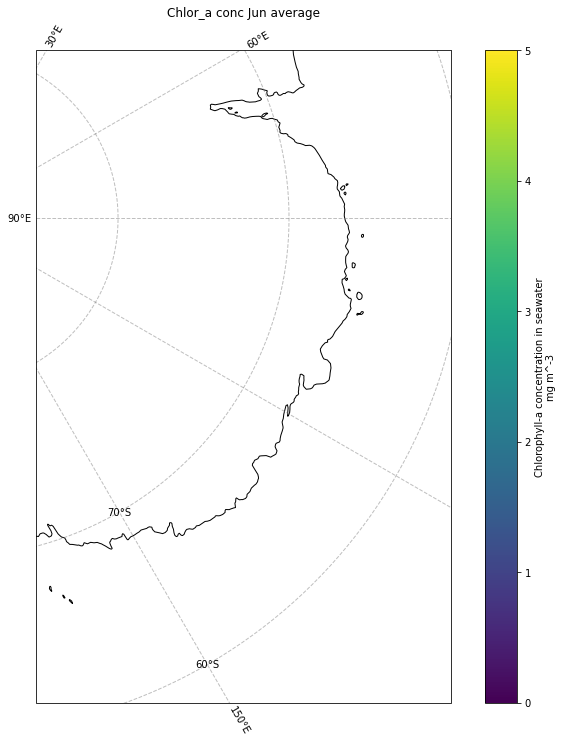

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


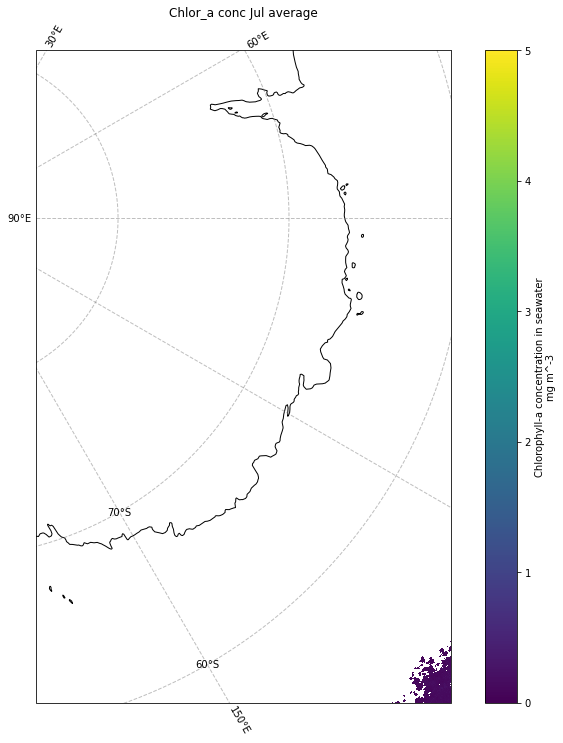

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


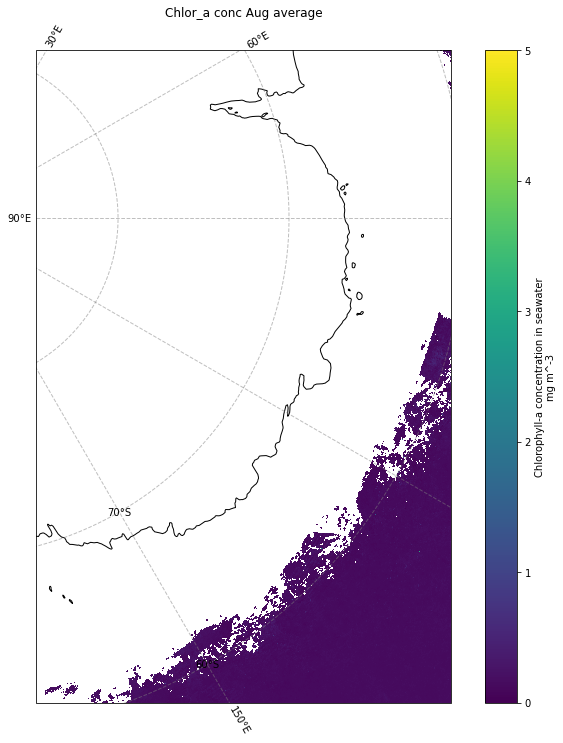

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


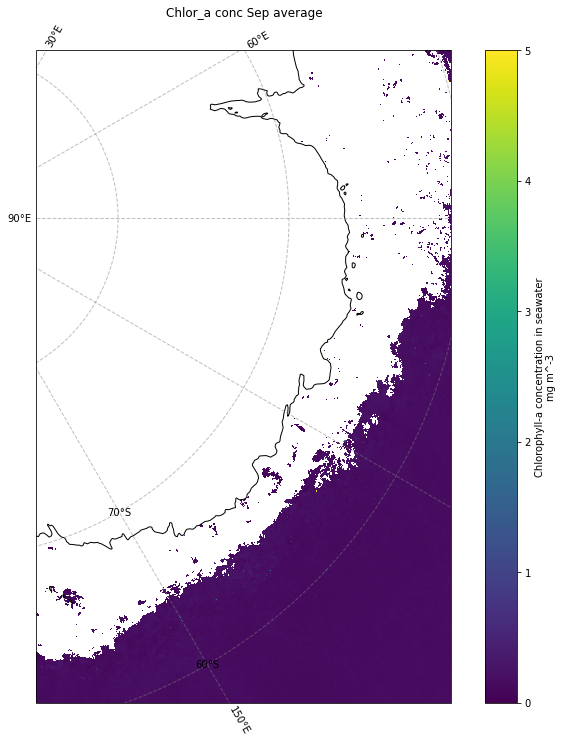

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


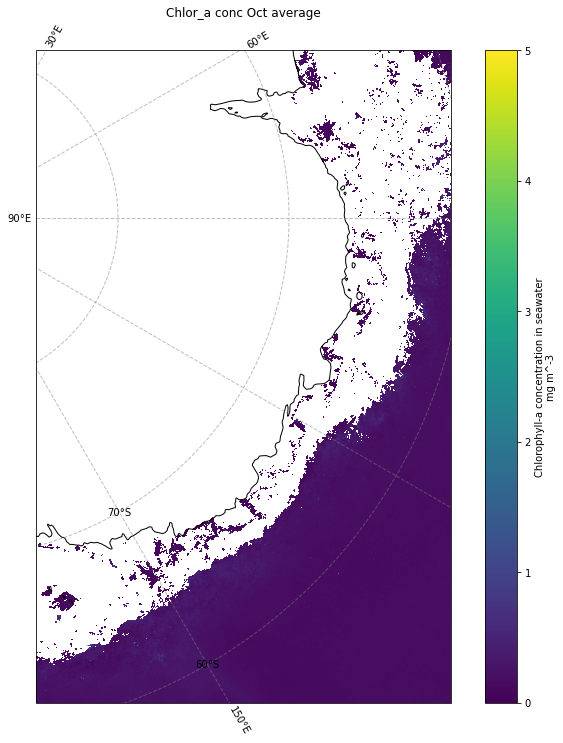

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


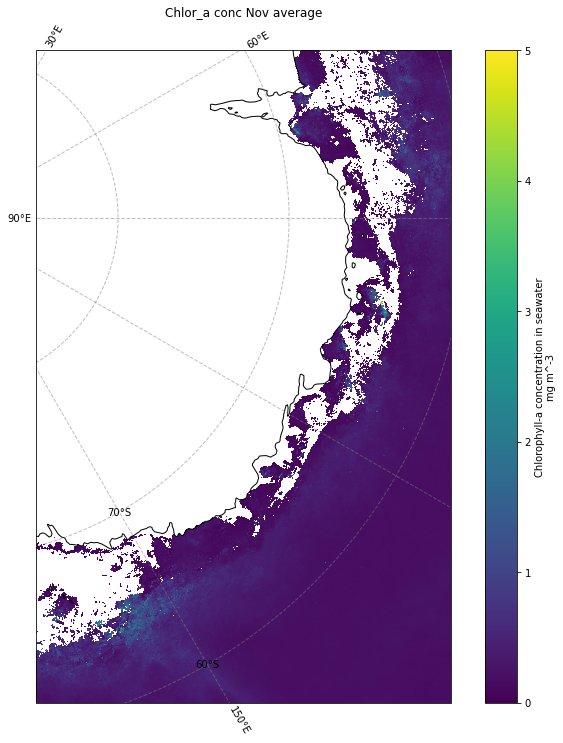

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


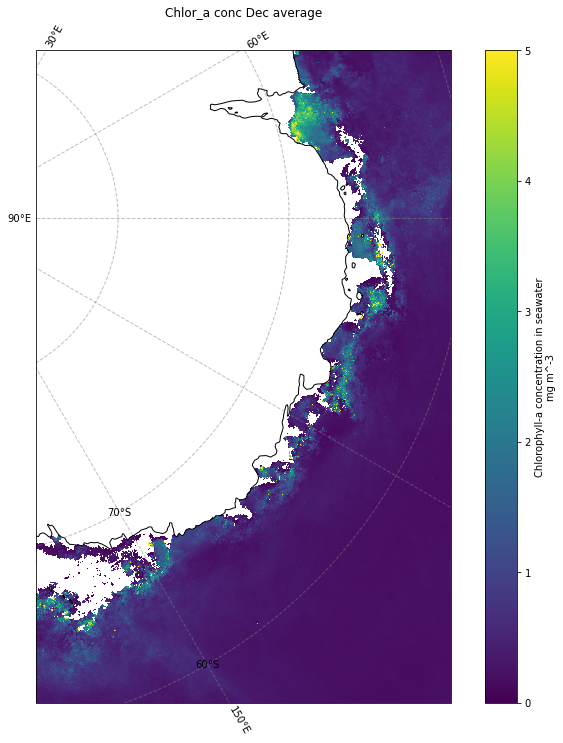

In [15]:
for MONTH in np.arange(1,13,1):

    to_plot=climat_chlor_ds.sel(month=MONTH).ave

    
    plt.figure(figsize=(12,12))
    ax=plt.subplot(projection=ccrs.SouthPolarStereo())


    plt.pcolormesh(
        to_plot.lon, 
        to_plot.lat, 
        to_plot,
        transform=ccrs.PlateCarree(),
        vmin=0, vmax=5,
        shading='gouraud'
        )

    ax.coastlines()

    plt.colorbar(label='Chlorophyll-a concentration in seawater\nmg m^-3')

    ax.set_extent([EAST_ANT_LONS[0], EAST_ANT_LONS[1], -75, -60], crs=ccrs.PlateCarree())

    add_south_pole_gridlines(ax)
    
    plt.title(f'Chlor_a conc {months[MONTH-1]} average')
    
    plt.show()
    
    

# And static plots of the same data

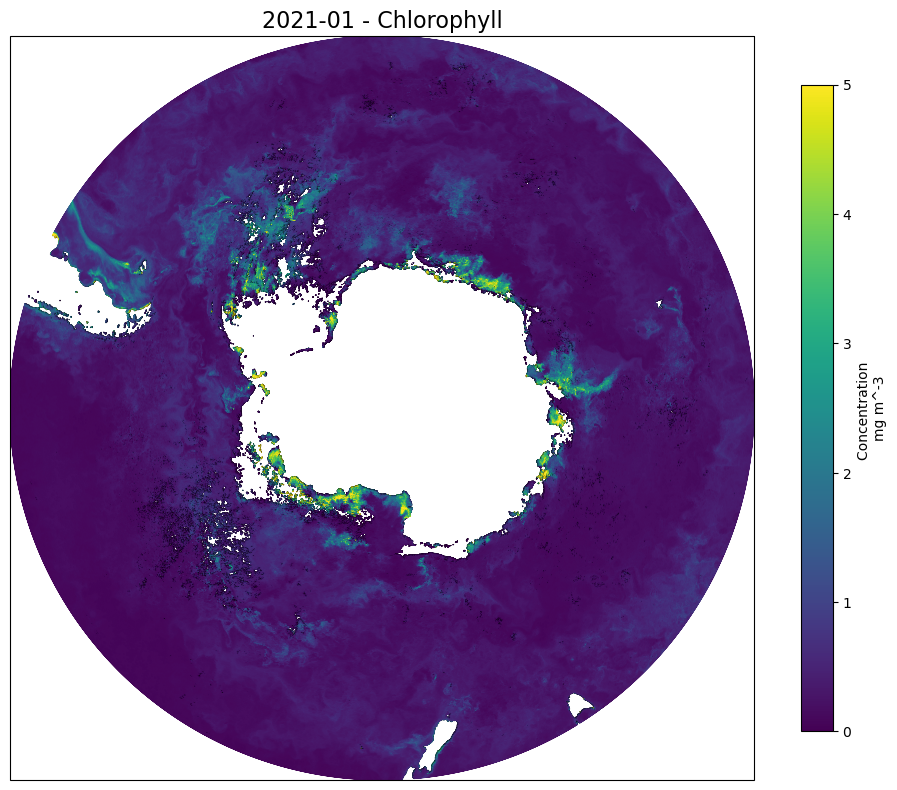

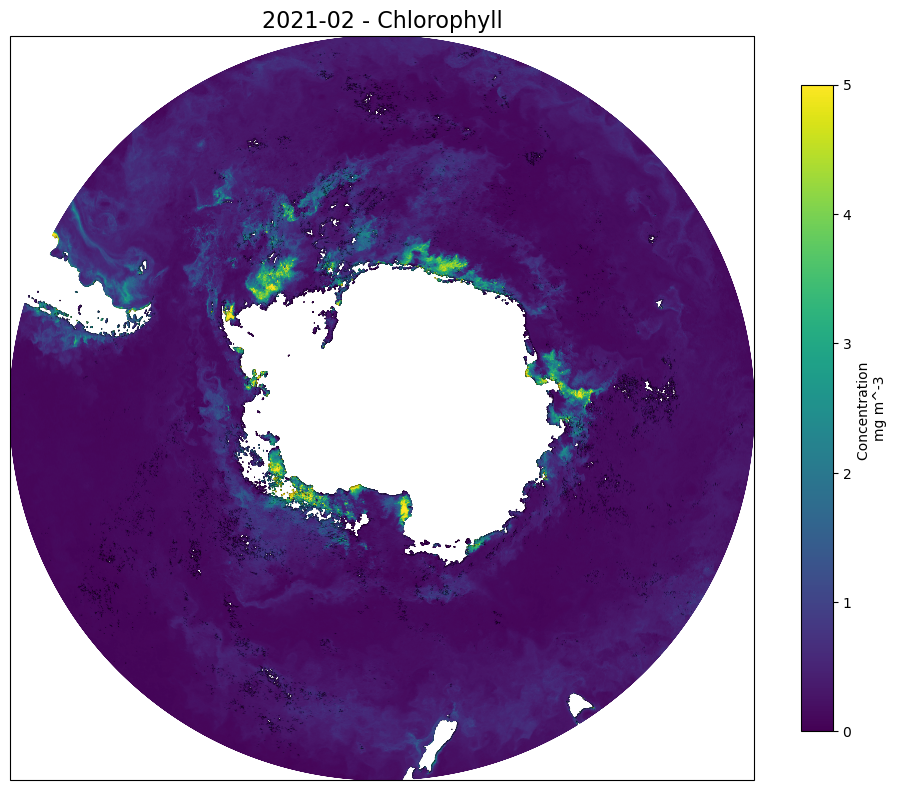

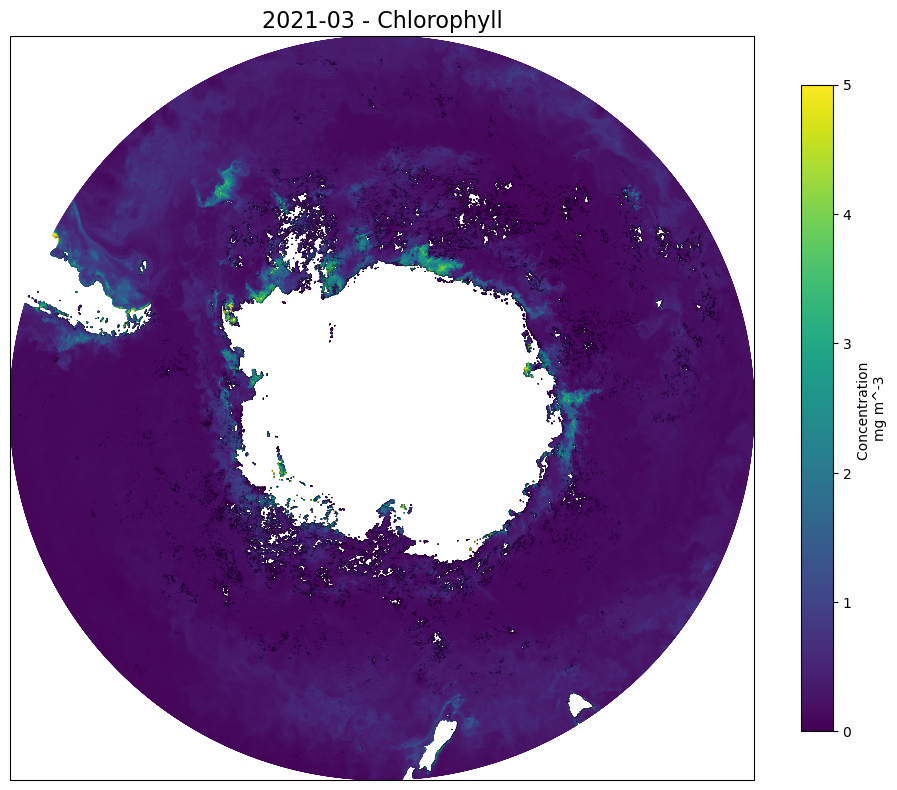

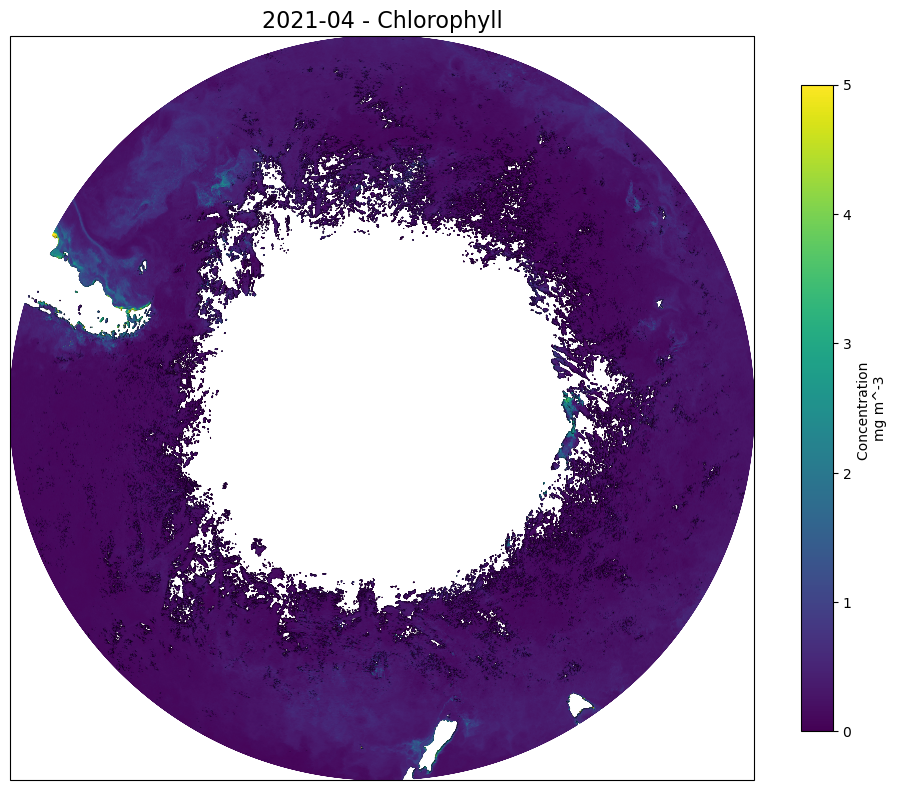

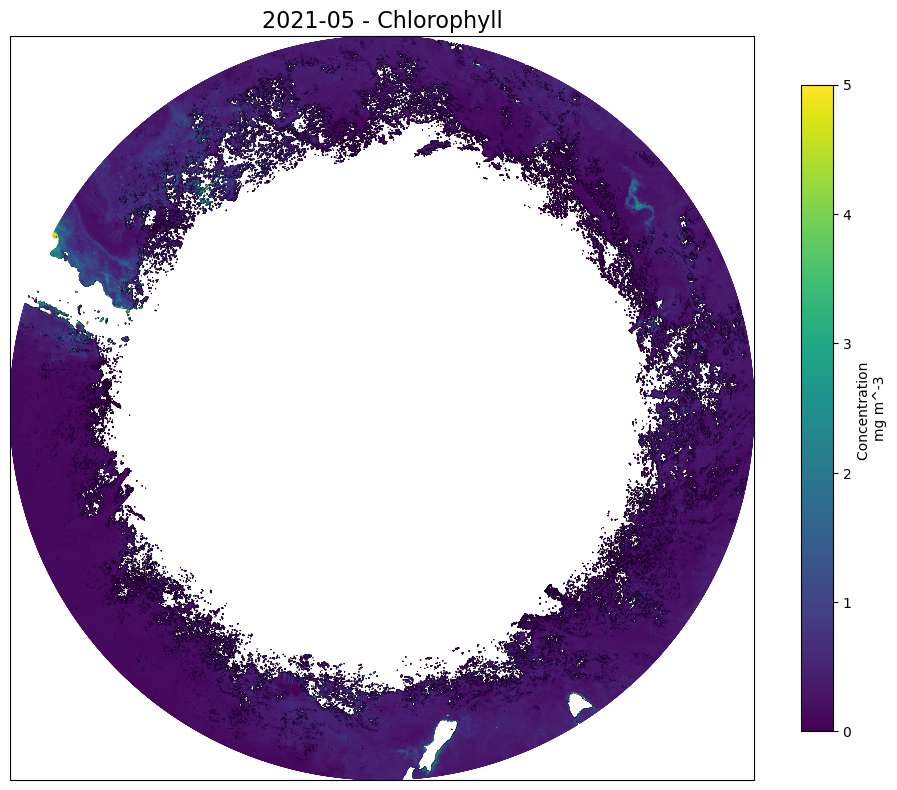

...

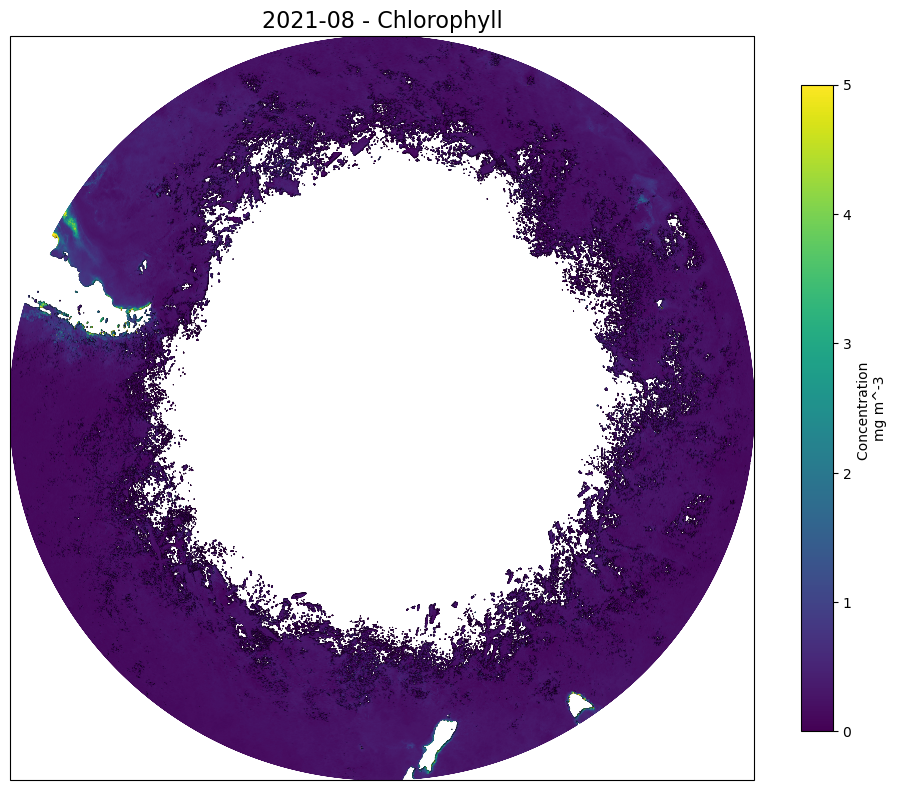

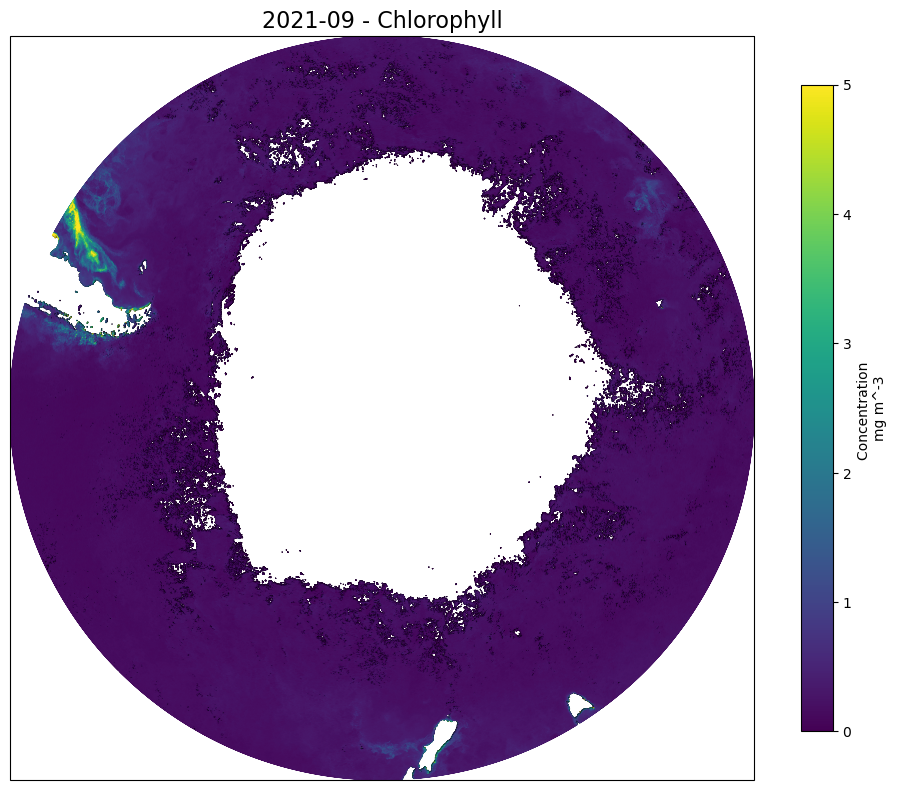

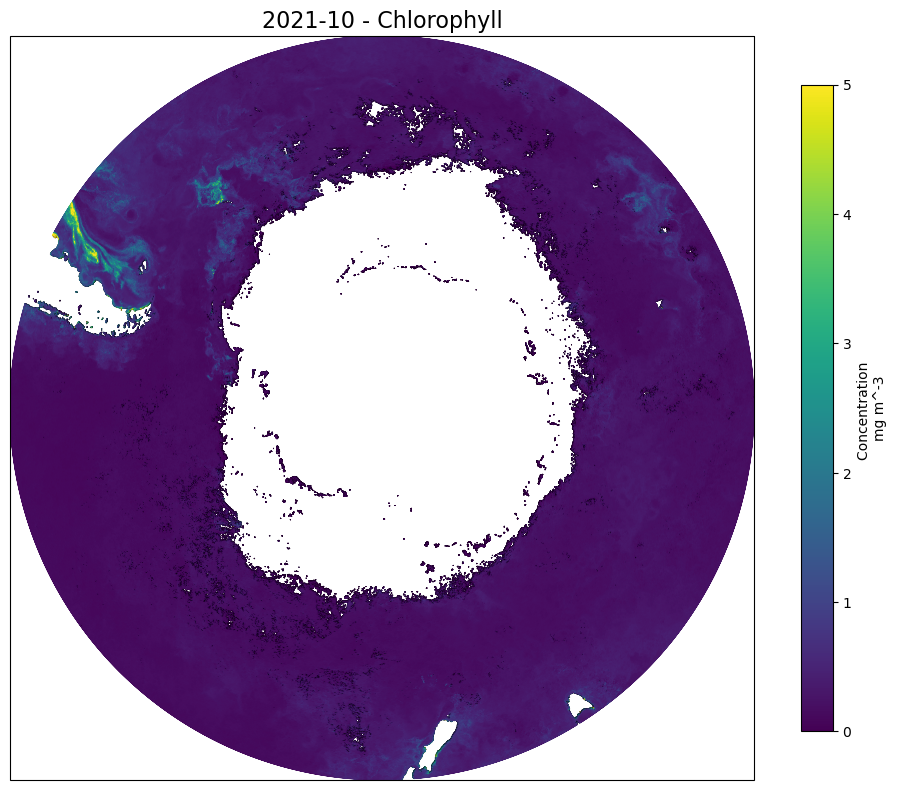

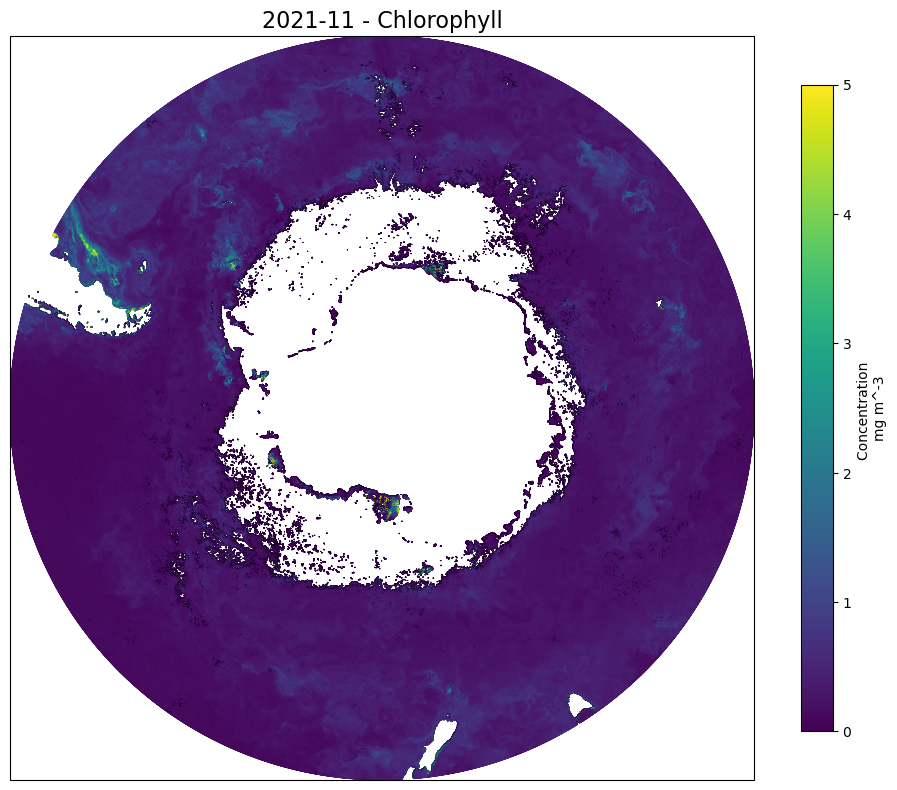

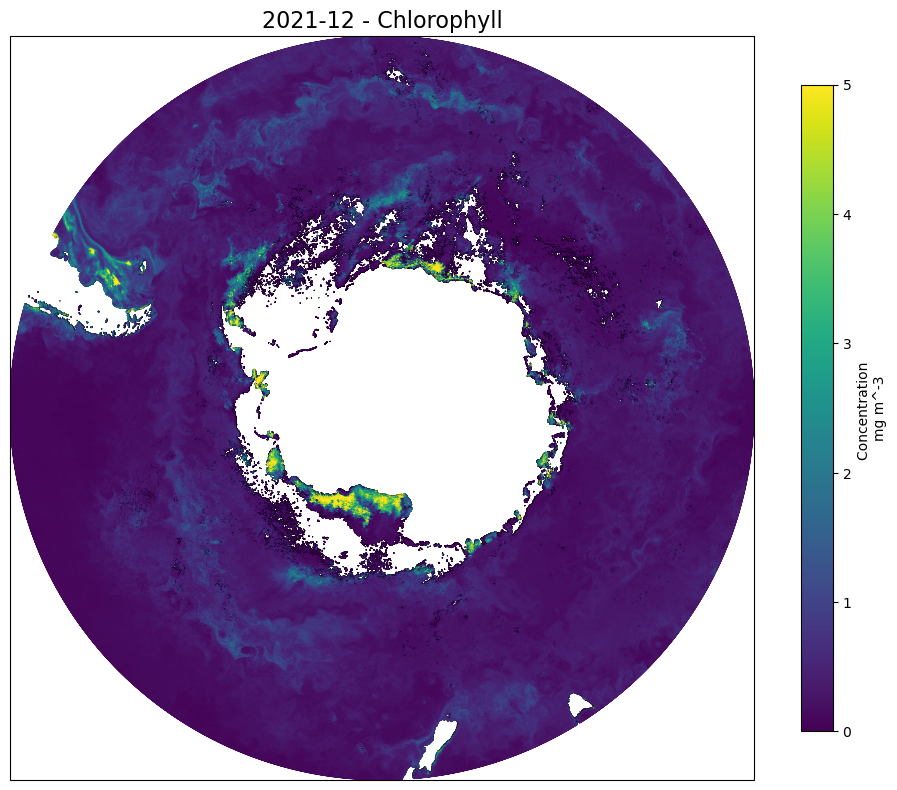

In [12]:
for iMonth in np.arange(1,13,1):
    plt.figure(figsize=(12,12))
    ax=plt.subplot(projection=ccrs.SouthPolarStereo())

    toPlot=chlor_da.sel(time=np.datetime64(str(YEAR)+"-"+"%02d" %iMonth)).load()

    plt.pcolormesh(toPlot.lon, toPlot.lat, toPlot,vmin=0, vmax=5,
    transform=ccrs.PlateCarree(),shading='gouraud')

    plt.title((f'{YEAR:04.0f}-{iMonth:02.0f} - Chlorophyll'), fontsize=16)

    plt.colorbar(
        shrink=0.7, 
        label='Concentration \nmg m^-3'
    )
    
    plt.show()

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.10/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
No handles with labels found to put in legend.


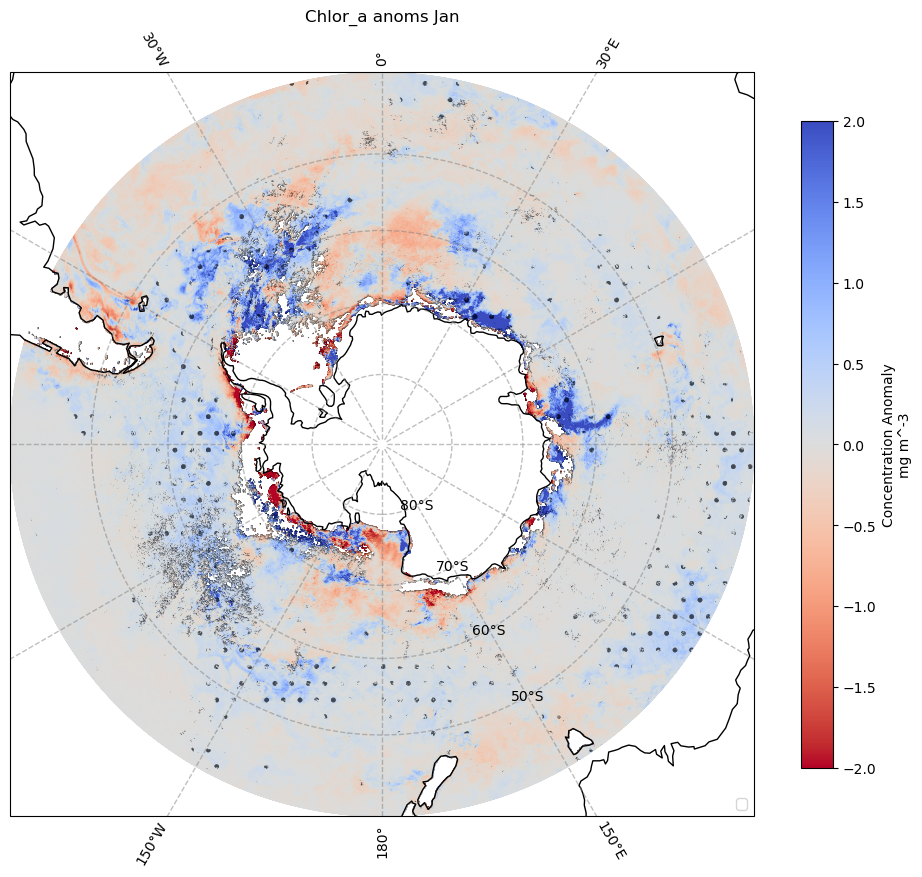

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.10/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
No handles with labels found to put in legend.


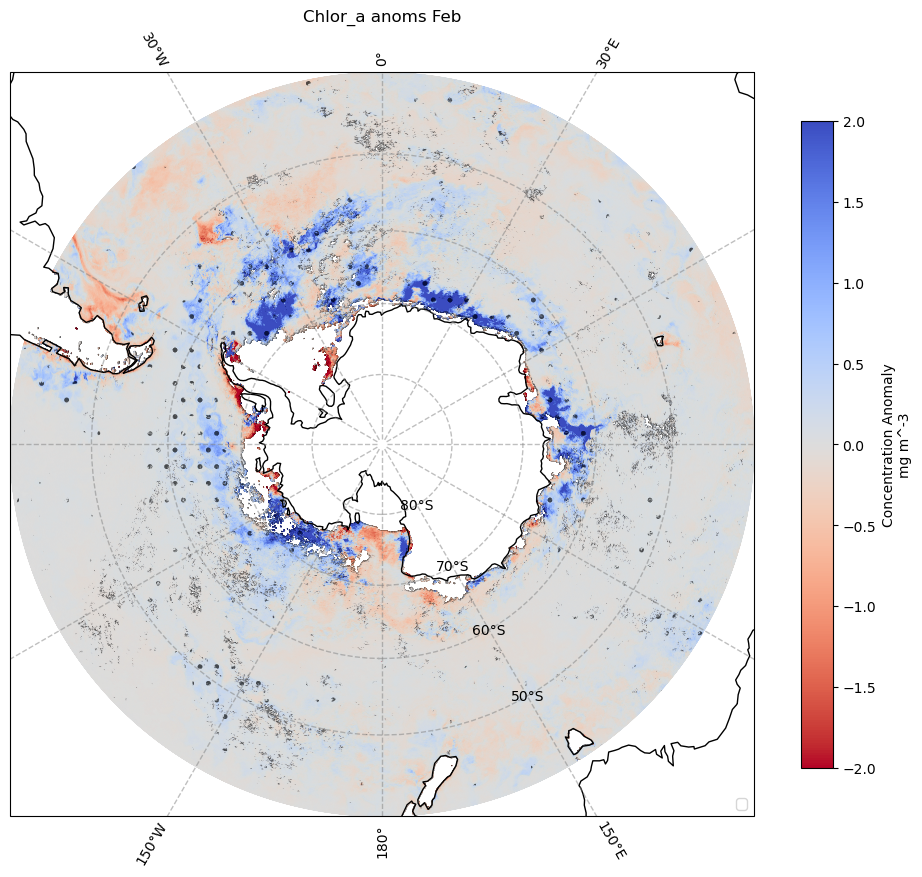

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.10/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
No handles with labels found to put in legend.


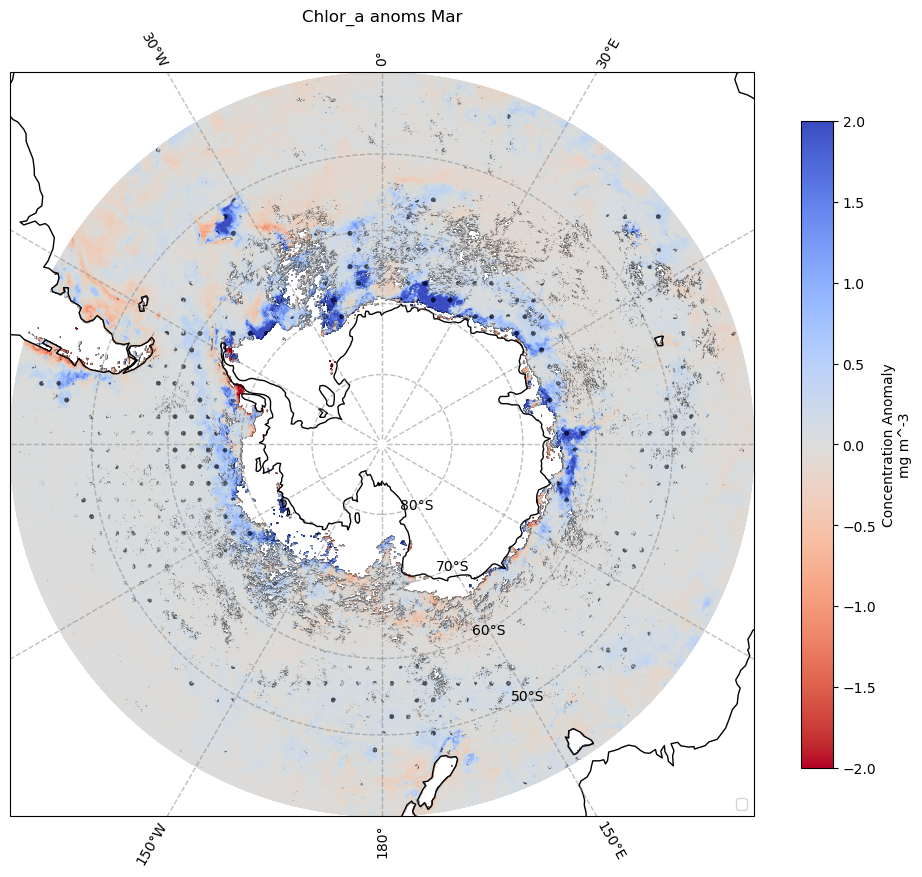

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.10/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
No handles with labels found to put in legend.


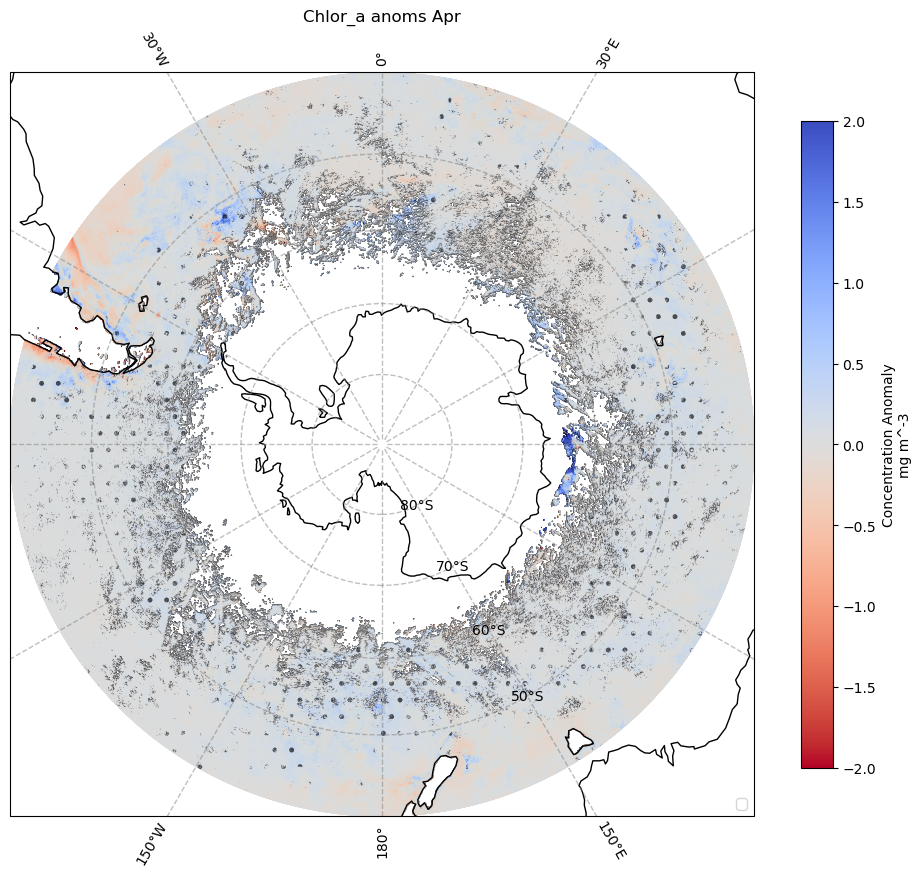

/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.10/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [ ]:
for iMonth in np.arange(1,13,1):
    plt.figure(figsize=(12,12))
    ax=plt.subplot(projection=ccrs.SouthPolarStereo())

    toPlot_anoms=anoms_da.sel(time=np.datetime64(str(YEAR)+"-"+"%02d" %iMonth)).load()

    #chlor_a conc anoms
    plt.pcolormesh(toPlot_anoms.lon, toPlot_anoms.lat, toPlot_anoms,vmin=-2, vmax=2, cmap='coolwarm_r',
    #levels=np.arange(-2,2.1,0.5),extend='both',
    transform=ccrs.PlateCarree(),shading='gouraud')




    plt.title((f'{YEAR:04.0f}-{iMonth:02.0f} - Chlorophyll Anomalies'), fontsize=16)
    #plt.xlim(EAST_ANT_LONS)
    #ax.set_extent([EAST_ANT_LONS[0], EAST_ANT_LONS[1], -75, -55])#, crs=ccrs.PlateCarree())

    plt.colorbar(
        shrink=0.7, 
        label='Concentration Anomaly\nmg m^-3'
    )
    
    plot_stipling_latlon(
        toPlot_anoms,
        2*climat_chlor_ds.st_dev.sel(month=iMonth),
        ax
    )

    add_south_pole_gridlines(ax)

    ax.coastlines()

    plt.legend(loc='lower right')
    plt.title(f'Chlor_a anoms {months[iMonth-1]}')

    plt.show()

# For the tracker - pngs / archive

In [106]:
START_YEAR='1980'

In [107]:
datetimes_xr=chlor_da.sel(time=slice(START_YEAR,'2050')).time

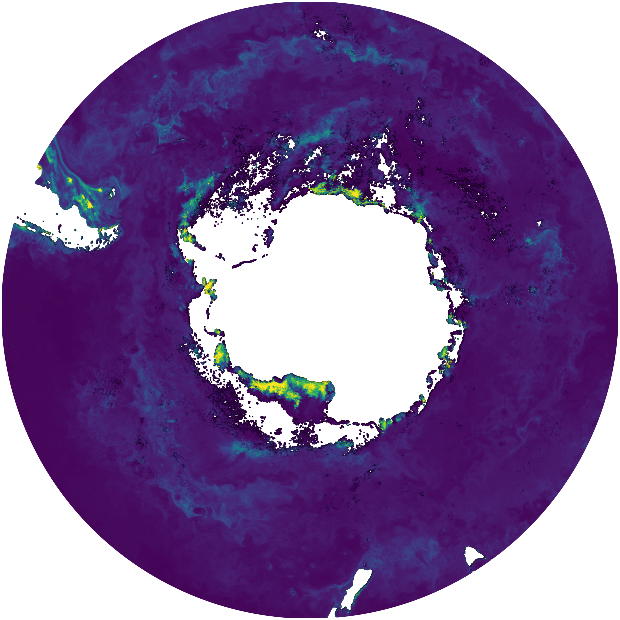

In [131]:
for iTime in datetimes_xr[-1:]:
    plt.figure(figsize=(40,40), dpi=20, frameon=False, facecolor=None)
    ax=plt.subplot(projection=ccrs.SouthPolarStereo(true_scale_latitude=-71))

    to_plot=chlor_da.sel(time=iTime)

    #chlor_a conc anoms
    qmesh = plt.pcolormesh(to_plot.lon, to_plot.lat, to_plot,vmin=0, vmax=5,
        #levels=np.arange(-2,2.1,0.5),extend='both',
        transform=ccrs.PlateCarree(),
        shading='gouraud')
    
    ax.axis('off')
    
    #ax.set_extent([-3950000.0, 3950000.0,-3950000.0, 4350000.0], ccrs.SouthPolarStereo(true_scale_latitude=-70))
    
       
    plt.savefig(
        f'{_data_dir}tracker_files_cog/chlor_conc/occci_chlor_conc_{iTime.dt.year.values}_{iTime.dt.month.values}.tiff',
        bbox_inches='tight', 
        transparent="True"
    )

    #plt.close()
    
    

In [95]:
import odc.geo.crs as ocrs

In [99]:
transformer=ocrs.CRS('epsg:3031').transformer_to_crs(ocrs.CRS('epsg:4326'))

In [100]:
transformer(x0,y0)

(-135.0, -23.130204845546483)

In [101]:
transformer(x1,y1)

(45.0, -23.130204845546483)

In [ ]:
#bounds [-23.13,-135,-23.13,45]

In [52]:
import matplotlib.colors as colors
import matplotlib.cm as cm

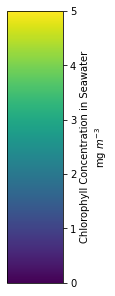

In [122]:
norm=colors.Normalize(vmin=0,vmax=5)
fig=plt.figure(figsize=(1,5))
ax=plt.subplot()
cb=fig.colorbar(
    cm.ScalarMappable(norm=norm, cmap='viridis'),
    label='Chlorophyll Concentration in Seawater\nmg $m^{-3}$',
    cax=ax,
    #aspect=2.5
)
#cb.set_ticks([15,30,45,60,75,90,100])


plt.savefig(f'{_work_dir}data/tracker/chlor_conc_legend.png',
               bbox_inches='tight', transparent="True")

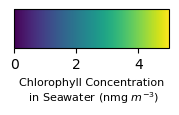

In [21]:
norm=colors.Normalize(vmin=0,vmax=5)
fig=plt.figure(figsize=(2,0.5))
ax=plt.subplot()
cb=fig.colorbar(
    cm.ScalarMappable(norm=norm, cmap='viridis'),
    cax=ax,
    orientation='horizontal'
    #aspect=2.5
)
cb.set_label('Chlorophyll Concentration\n in Seawater (nmg $m^{-3}$)',size=8)

#cb.set_ticks([15,30,45,60,75,90,100])


plt.savefig(f'{_data_dir}tracker_data/chlor_conc_legend_horiz.png', bbox_inches='tight', transparent="True")

In [ ]:
for iTime in datetimes_xr[-12:]:
    plt.figure(figsize=(40,40), dpi=20, frameon=False, facecolor=None)
    ax=plt.subplot(projection=ccrs.SouthPolarStereo(true_scale_latitude=-71))

    to_plot=anoms_da.sel(time=iTime)

    #chlor_a conc anoms
    plt.pcolormesh(to_plot.lon, to_plot.lat, to_plot,
        #levels=np.arange(-2,2.1,0.5),extend='both', 
        cmap='coolwarm_r',
        vmin=-2, vmax=2,
       transform=ccrs.PlateCarree(),
        shading='gouraud')
    
    ax.axis('off')
    
    #ax.set_extent([-3950000.0, 3950000.0,-3950000.0, 4350000.0], ccrs.SouthPolarStereo(true_scale_latitude=-70))
    
       
    plt.savefig(
        f'{_work_dir}data/tracker/chlor_conc_anoms/occci_chlor_conc_anoms_{iTime.dt.year.values}_{iTime.dt.month.values}.png',
        bbox_inches='tight', 
        transparent="True"
    )

    #plt.close()
    
    

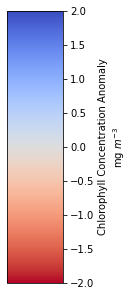

In [124]:
norm=colors.Normalize(vmin=-2,vmax=2)
fig=plt.figure(figsize=(1,5))
ax=plt.subplot()
cb=fig.colorbar(
    cm.ScalarMappable(norm=norm, cmap='coolwarm_r'),
    label='Chlorophyll Concentration Anomaly\nmg $m^{-3}$',
    cax=ax,
    #aspect=2.5
)
#cb.set_ticks([15,30,45,60,75,90,100])


plt.savefig(f'{_work_dir}data/tracker/chlor_conc_anoms_legend.png',
               bbox_inches='tight', transparent="True")

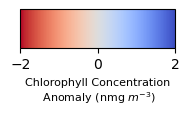

In [53]:
norm=colors.Normalize(vmin=-2,vmax=2)
fig=plt.figure(figsize=(2,0.5))
ax=plt.subplot()
cb=fig.colorbar(
    cm.ScalarMappable(norm=norm, cmap='coolwarm_r'),
    cax=ax,
    orientation='horizontal'
    #aspect=2.5
)
cb.set_label('Chlorophyll Concentration\n Anomaly (nmg $m^{-3}$)',size=8)

#cb.set_ticks([15,30,45,60,75,90,100])

#
plt.savefig(f'{_data_dir}tracker_data/chlor_conc_anoms_legend_horiz.png', bbox_inches='tight', transparent="True")

# EA average ??

In [26]:
eant_means_chlor_da=chlor_da.where(
    (chlor_da.lon>EAST_ANT_LONS[0])
    *(chlor_da.lon<EAST_ANT_LONS[1])
    *(chlor_da.lat<-60)
).mean(['lat','lon'])

In [32]:
eant_climat_chlor_ds=climatology(eant_means_chlor_da)

/g/data/dk92/apps/anaconda3/2020.12/envs/NCI-data-analysis_2021.09.1/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


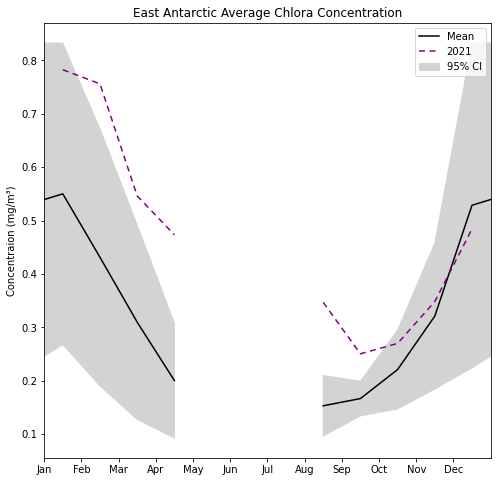

In [36]:
plt.figure(figsize=[8,8])
plt.subplot()

plot_climat_monthly(eant_climat_chlor_ds)

plot_year(eant_means_chlor_da, 2021)

#plt.yticks(
#    ticks=[0, 5e6, 10e6, 15e6, 20e6],
#    labels=['0','5','10','15','20']
#)
plt.ylabel('Concentraion (mg/m\u00b3)')

plt.title('East Antarctic Average Chlora Concentration')
plt.legend()


# Anoms (Vectors)

In [ ]:
#calculate the polygons - limit to 2021 as an example


gdf_ls=list()
for month in anoms_da.sel(time=slice(str(YEAR),str(YEAR))).time.values:
    
    anoms_month_da=anoms_da.sel(time=month)
    
    gdf_ls.append(
        contourf_polygons(anoms_month_da, levels=np.arange(-2.25,2.3,0.5)) 
    )

    month_str=np.datetime_as_string(anoms_month_da.time, unit='M')
    
    gdf_ls[-1].to_file(
        f'{_data_dir}/processed_chlor/anoms/contourf_polygons_{month_str}.shp', 
        #output_driver = "GeoJSON"
) 


/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/g/data/jk72/as2285/miniconda3/envs/sea-ice-tracker/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed

In [ ]:
gdf=gdf_ls[0]

example for jan 21

In [ ]:
# plot  the polygon vectors
from ipyleaflet import Map, basemaps, GeoData, LayerGroup, LayersControl, LegendControl, projections
from ipywidgets import Layout
import matplotlib.colors as mplcolors
import matplotlib.cm

levels=gdf.level.unique()

#extract a colour for each level
cmap = matplotlib.cm.get_cmap('coolwarm_r')
colors = [mplcolors.rgb2hex(cmap(i)) for i in np.arange(0,1.01,(1/(len(levels)-1)))] 

#load each contour level as a seperate GeoData layer    
geodata_ls=[
    GeoData(
        geo_dataframe=gdf.where(gdf.level==float(levels[iLevel])),
        style={'color': colors[iLevel], 'fillColor': colors[iLevel], 'opacity':0.75, 'weight':1.9, 'dashArray':'2', 'fillOpacity':1},
    )
    for iLevel in range(len(levels))
]

#group the contours all together
grouped_layers=LayerGroup(layers=geodata_ls)#, name=f'{YEAR} Duration Anomalies')

#somewhere to show the results
spsLayout=Layout(width='600px', height='600px')
zoom = 0.85
center = [-70, 130]
map = Map(basemap=basemaps.NASAGIBS.BlueMarble3031, center=center, zoom=zoom, crs=projections.EPSG3031, layout=spsLayout )
map.add_layer(grouped_layers);

control = LayersControl(position='topright')
map.add_control(control)

#to-do: add legend

map